**Import all the libraries :**

In [ ]:
import os
import re
import cv2
import tarfile
import datetime
import warnings
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
from tqdm import tqdm
import tensorflow as tf
from tensorflow import concat
from tensorflow import repeat
from collections import Counter
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
warnings.filterwarnings('ignore')
from sklearn.utils import shuffle
import xml.etree.ElementTree as ET
from keras.models import load_model
from skimage.transform import resize
import nltk.translate.bleu_score as bleu
from tensorflow.keras.models import Model
from google.colab.patches import cv2_imshow
from keras.preprocessing.text import Tokenizer
from tensorflow.keras.backend import expand_dims 
from keras.layers import concatenate, Concatenate
from nltk.translate.bleu_score import sentence_bleu
from tensorflow.keras.layers import TimeDistributed
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import DenseNet121
from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.densenet import preprocess_input
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.layers import Input, Softmax, RNN, Dense, Embedding, LSTM, Layer, Dropout
import keras

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


<h2>Getting Structured Data :</h2>

In [ ]:
dataframe = pd.read_csv('/content/drive/MyDrive//data_1.csv')

In [ ]:
dataframe.head()

,image_name,image_caption,findings,impression,image_count,findings_count,impression_count
0,"CXR780_IM-2323-1001.png,CXR780_IM-2323-2001.png",pa and lateral chest,heart size is upper limits of normal mediastin...,clear lungs no acute cardiopulmonary findings,2,49,6
1,"CXR431_IM-2072-1002.png,CXR431_IM-2072-1001.png",chest frontal lateral,the heart size is normal cardiomediastinal sil...,no radiographic evidence of tuberculosis or sa...,2,46,7
2,"CXR2462_IM-0995-1001.png,CXR2462_IM-0995-3001.png",chest pa and lateral,there is stable cardiomegaly aorta is calcifie...,cardiomegaly and findings of prior asbestos ex...,2,31,12
3,"CXR115_IM-0102-1001.png,CXR115_IM-0102-2001.png",ray chest pa and lateral,the lungs are clear there is hyperinflation of...,copd no acute pulmonary disease,2,28,5
4,"CXR1601_IM-0390-2001.png,CXR1601_IM-0390-1001.png",views chest,the lungs and pleural spaces show no acute abn...,no acute pulmonary abnormality,2,17,4


In [ ]:
dataframe["image_name"].isnull().sum()

104

In [ ]:
dataframe.dropna(subset = ["image_name"], inplace=True)
dataframe.shape

(3851, 7)

In [ ]:
#Dataset taken from kaggle
#Refer : https://www.kaggle.com/usersan/chest-x-ray-indiana-u-frontal-or-lateral
projections = pd.read_csv("/content/drive/MyDrive/indiana_projections.csv")
projections.head()

,uid,filename,projection
0,1,1_IM-0001-4001.dcm.png,Frontal
1,1,1_IM-0001-3001.dcm.png,Lateral
2,2,2_IM-0652-1001.dcm.png,Frontal
3,2,2_IM-0652-2001.dcm.png,Lateral
4,3,3_IM-1384-1001.dcm.png,Frontal


**Note :** There are only two image types Frontal and Lateral, but we have 1, 3, 4, and 5 images associated for each datapoints. we have met a conflict here that how we provide the data points to the model we build. Because of this conflict we need to come up with an idea to handle how we input the data to the model.

In [ ]:
def front_lateral(lst):
    ''' This Function check the image projection of the different images
    and return frontal or lateral of the given image '''
    frontal = []
    lateral = ""
    for img in lst:
        projection = projections[projections['filename'].str.contains(re.search(r"\d.*\_IM-\d.*\.", img).group())]['projection'].values
        if projection == "Lateral":
            lateral = img
        else:
            frontal.append(img)
    return frontal, lateral

In [ ]:
columns = ["front X-Ray", "lateral X-Ray", "findings"]

df = pd.DataFrame(columns = columns)
#Creating diffrent dataframe for single images, 
#to distribute it in all train test validate dataset in equal proportion.
SingleImages_df = pd.DataFrame(columns = columns)

for item in tqdm(dataframe.iterrows()):
    img_lst = item[1]['image_name'].split(',')

    if len(img_lst) > 2:
        #check projection of x-ray images
        frontal, lateral = front_lateral(img_lst)
        
        #If no lateral x-ray is present
        if lateral == "":
            frontal, lateral = frontal[:-1], frontal[-1]
        
        #If more than one frontal image is present 
        for i in frontal:
            xray_front = i
            xray_lat = lateral
            df = df.append(pd.Series([xray_front, xray_lat, item[1]['findings']], index = columns), ignore_index = True)

    elif len(img_lst) == 2:
        xray_front = img_lst[0] 
        xray_lat = img_lst[1]
        df = df.append(pd.Series([xray_front, xray_lat, item[1]['findings']], index = columns), ignore_index = True)

    elif len(img_lst) == 1:
        xray_front = img_lst[0] 
        xray_lat = img_lst[0]
        SingleImages_df = SingleImages_df.append(pd.Series([xray_front, xray_lat, item[1]['findings']], index = columns), ignore_index = True)

3851it [00:13, 296.14it/s]


In [ ]:
train1, test1  = train_test_split(df, test_size = 0.10, random_state = 42, shuffle = True)
train1, valid1 = train_test_split(train1, test_size = 0.10, random_state = 42, shuffle = True)

print('train data :', train1.shape)
print('test data  :', test1.shape)
print('valid data :', valid1.shape)

train data : (2860, 3)
test data  : (354, 3)
valid data : (318, 3)


In [ ]:
train2, test2  = train_test_split(SingleImages_df, test_size = 0.10, random_state = 42, shuffle = True)
train2, valid2 = train_test_split(train2, test_size = 0.10, random_state = 42, shuffle = True)


print('train data :', train2.shape)
print('test data  :', test2.shape)
print('valid data :', valid2.shape)

train data : (360, 3)
test data  : (45, 3)
valid data : (41, 3)


**Observations :**
* I splitted data into train, test and validation.
* Test split ratio 10% of total data.
* validation split ratio 10% of train data.

**Append Single image data equally with train test, and validation dataset :**

In [ ]:
train = np.append(train1, train2, axis=0)
test = np.append(test1, test2, axis=0)
valid = np.append(valid1, valid2, axis=0)
print("===== Final data point shape =====")
train.shape, test.shape, valid.shape

===== Final data point shape =====


((3220, 3), (399, 3), (359, 3))

**Shuffle the data point :**

In [ ]:
# Set a random state
from sklearn.utils import shuffle
for i in range(3):
    train = shuffle(train, random_state=15)
    test = shuffle(test, random_state=15)
    valid = shuffle(valid, random_state=15)

**Observations :**

limiting the data point to 2 images per data point, if we have 5 images, its 4+1 (all image + last image) so make it as 4 data points, I converted multipal images into two images. For that I have implemented following steps:

1. if I have 5 images then
* 1 image + 5th image
* 2nd image + 5th image
* 3rd image + 5th image
* 4th image + 5th image
* Total 4 data points created

2. If I have 4 images then
* 1st + 4th
* 2nd + 4th
* 3rd + 4th
* Total 3 data points created

3. If I have 3 images then
* 1st + 3rd
* 2nd + 3rd
* Total 2 data points created

4. If I have 2 images then it is according to our requirement

5. At last, If i have 1 image, i just replicate it and make it 2. we should create diffrent dataframe separately to include it in all dataset train test validate sets.

<h2>Baseline Model :</h2>

**Note :** For baseline model, I will train the model with images and ouptut. I Consider finding features as target variable, as it has much data volume and from sample data points, It is clear that this feature gives most of the information present in images.

**load structured data :**

In [ ]:
train= train[:-20,:]
train.shape

(3200, 3)

In [ ]:
validation = valid[:-9,:]
validation.shape

(350, 3)

In [ ]:
columns = ["front X-Ray", "lateral X-Ray", "findings"]

train = pd.DataFrame(train, columns = columns)
test = pd.DataFrame(test, columns = columns)
validation = pd.DataFrame(validation, columns = columns)

**Add start and end token and prepare decoder input with output :**

In [ ]:
def decoder_io(df):
  '''This function Add start and end token in finding feature and prepare decoder input with output
  It takes dataframe(df) as parameter and returns df after applying necessary operations. '''
  
  df['dec_ip'] = '<start>' + ' ' + df.findings.astype(str)  #Decoder input
  df['dec_op'] = df.findings.astype(str) + ' ' +'<end>'     #Decoder output
  df['findings']      = '<start> ' + df.findings + ' <end>'
  return df

In [ ]:
train = decoder_io(train)
validation = decoder_io(validation)
test = decoder_io(test)

In [ ]:
train.head()

,front X-Ray,lateral X-Ray,findings,dec_ip,dec_op
0,CXR867_IM-2387-2001.png,CXR867_IM-2387-1001.png,<start> heart size near top normal bilateral h...,<start> heart size near top normal bilateral h...,heart size near top normal bilateral hilar ful...
1,CXR1942_IM-0611-0001-0001.png,CXR1942_IM-0611-0001-0001.png,<start> the lungs and pleural spaces show no a...,<start> the lungs and pleural spaces show no a...,the lungs and pleural spaces show no acute abn...
2,CXR2948_IM-1348-2001.png,CXR2948_IM-1348-1001.png,<start> the heart size and pulmonary vasculari...,<start> the heart size and pulmonary vasculari...,the heart size and pulmonary vascularity appea...
3,CXR3655_IM-1817-1001.png,CXR3655_IM-1817-2001.png,<start> well circumscribed mm right upper lobe...,<start> well circumscribed mm right upper lobe...,well circumscribed mm right upper lobe nodule ...
4,CXR2677_IM-1151-1001.png,CXR2677_IM-1151-2001.png,<start> heart size normal mild tortuosity of t...,<start> heart size normal mild tortuosity of t...,heart size normal mild tortuosity of the thora...


**Transfer Learning : CHeXNET Model (pretrained)**

CheXNET Model is a Denset121 layered model which is trained on 112,120 number of chest x-ray images for the classification of 14 diseases. We can load the weights of that model and pass the image through that model. The top layer will be ignored.

In [ ]:
image_model = DenseNet121(weights='/content/drive/MyDrive/brucechou1983_CheXNet_Keras_0.3.0_weights.h5', classes = 14, input_shape=(256,256,3))

In [ ]:
model = Model(image_model.input, image_model.layers[-2].output)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.692339 to fit



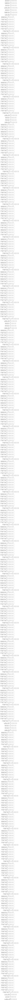

In [ ]:
tf.keras.utils.plot_model(model, to_file='model_1_plot.png', show_shapes=True, show_layer_names=True)

**Image to tensor convert :**

In [ ]:
def load_image(img_name):
  """Loads image in array format"""

  image = Image.open(img_name)
  X = np.asarray(image.convert("RGB"))
  X = np.asarray(X)
  X = preprocess_input(X)
  X = resize(X, (256,256,3))
  X = np.expand_dims(X, axis=0)
  X = np.asarray(X)
    
  return X

In [ ]:
def image(df):
  '''
    input -- dataframe(df)
    output -- dataframe(df)
    process - convert images into 256 X 256, then using CHeXNET model generate tensor(concate two image tensor)

  '''
  path = '/content/images/'
  image1_paths = df['front X-Ray'].astype(str).tolist()
  image2_paths = df['lateral X-Ray'].astype(str).tolist()

  image_features = []
  for i in tqdm(range(len(image1_paths))):

    i1 = load_image(path+image1_paths[i])
    i2 = load_image(path+image2_paths[i])
    img1_features = model.predict(i1)
    img2_features = model.predict(i2)
    img1_features = np.vstack(img1_features).astype(np.float)
    img2_features = np.vstack(img2_features).astype(np.float)
    
    tensor = np.concatenate((img1_features, img2_features), axis=1)

    image_features.append(tensor)
  df['image_features'] =image_features
  return df


In [ ]:
cwd = os.getcwd()
print(cwd)

/content


In [ ]:
import tarfile
images = tarfile.open('/content/drive/MyDrive/NLMCXR_png.tgz')
images.extractall(cwd+'/images/')

In [ ]:
train = image(train)
test = image(test)
validation = image(validation)

100%|██████████| 350/350 [01:46<00:00,  3.30it/s]


In [ ]:
train_np = train.to_numpy()
test_np = test.to_numpy()
validation_np = validation.to_numpy()

np.save('/content/drive/MyDrive/train_1', train_np)
np.save('/content/drive/MyDrive/test_1', test_np)
np.save('/content/drive/MyDrive/validation_1', validation_np)

In [ ]:
train.head()

,front X-Ray,lateral X-Ray,findings,dec_ip,dec_op,image_features
0,CXR867_IM-2387-2001.png,CXR867_IM-2387-1001.png,<start> heart size near top normal bilateral h...,<start> heart size near top normal bilateral h...,heart size near top normal bilateral hilar ful...,"[[0.0, 0.0013326966436579823, 0.00195155735127..."
1,CXR1942_IM-0611-0001-0001.png,CXR1942_IM-0611-0001-0001.png,<start> the lungs and pleural spaces show no a...,<start> the lungs and pleural spaces show no a...,the lungs and pleural spaces show no acute abn...,"[[7.388147196252248e-07, 0.0016718057449907064..."
2,CXR2948_IM-1348-2001.png,CXR2948_IM-1348-1001.png,<start> the heart size and pulmonary vasculari...,<start> the heart size and pulmonary vasculari...,the heart size and pulmonary vascularity appea...,"[[1.625115874048788e-05, 0.0013096935581415892..."
3,CXR3655_IM-1817-1001.png,CXR3655_IM-1817-2001.png,<start> well circumscribed mm right upper lobe...,<start> well circumscribed mm right upper lobe...,well circumscribed mm right upper lobe nodule ...,"[[0.00016417188453488052, 0.001755982171744108..."
4,CXR2677_IM-1151-1001.png,CXR2677_IM-1151-2001.png,<start> heart size normal mild tortuosity of t...,<start> heart size normal mild tortuosity of t...,heart size normal mild tortuosity of the thora...,"[[5.5813827202655375e-05, 0.002016018610447645..."


**Text Tokenization :**

In [ ]:
token = Tokenizer( filters='!"#$%&()*+,-/:;=?@[\\]^_`{|}~\t\n')
token.fit_on_texts(train['findings'])

token.word_index['<pad>'] = 0
token.index_word[0] = '<pad>'
vocab_size = len(token.word_index) + 1
print('Vocab size - ', vocab_size)

#sequence in train and validation
train_inp_dec = token.texts_to_sequences(train.dec_ip)
train_op_dec = token.texts_to_sequences(train.dec_op)
val_inp_dec = token.texts_to_sequences(validation.dec_ip)
val_op_dec = token.texts_to_sequences(validation.dec_op)

#padding in the train and validation 
max_len = 100
decoder_input = pad_sequences(train_inp_dec, maxlen=max_len, padding='post')
decoder_output =  pad_sequences(train_op_dec, maxlen=max_len, padding='post') 
Validation_decoder_input = pad_sequences(val_inp_dec, maxlen=max_len, padding='post') 
Validation_decoder_output = pad_sequences(val_op_dec, maxlen=max_len, padding='post')
print(decoder_input[:1])

word_idx = {}
idx_word = {}
for key, value in (token.word_index).items(): 
    word_idx[key] = value
    idx_word[value] = key

Vocab size -  1644
[[   5   13   17  279  302    7   94  101  672  621   22   93   47  104
   324  198  188  280    8  579  246  805  335    9  215    8  455  103
   179   25  292  257   28  164   28  491  406    2   18  148   24    2
   108   10   15   46  443  920 1150  456   47   36  325    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0]]


**Encoder and Decoder :**

**Writing Encoder :**

In [ ]:
class Encoder(tf.keras.Model):
    '''
    Encoder model -- That takes a input sequence and returns encoder-outputs,encoder_final_state_h,encoder_final_state_c
    '''

    def __init__(self,lstm_units):
        super().__init__()
        self.lstm_units = lstm_units
        self.dense      = Dense(self.lstm_units,kernel_initializer = tf.keras.initializers.glorot_uniform(seed = 40),name = 'encoder_dense_layer')
        self.dropout    = Dropout(0.3)


    def call(self,x):
        
        # x : image_data
        self.encoder_output = self.dense(x)
        self.encoder_output =self.dropout(self.encoder_output )

        return self.encoder_output

**Writing Decoder :**

In [ ]:
class Decoder(Model):
    '''
    Decoder model -- That takes a input sequence and returns output sequence
    '''

    def __init__(self,vocab_size,embedding_dim,lstm_units):
        super().__init__()
        self.vocab_size    = vocab_size
        self.lstm_units    = lstm_units
        self.embedding_dim = embedding_dim
        
        self.dropout   = Dropout(0.3)
        self.embedding = Embedding(self.vocab_size,self.embedding_dim,trainable = True)
        self.lstm      = LSTM(self.lstm_units, return_sequences=True, name="Decoder_LSTM")

        
    def call(self,x):
        
        # x : input_sequence
        self.target_embedd = self.embedding(x)
        self.target_embedd = self.dropout(self.target_embedd )
        self.lstm_output   = self.lstm(self.target_embedd)

        return self.lstm_output

**Encoder-Decoder Model :**

In [ ]:
class Encoder_decoder(Model):
    '''
        A. Pass the input sequence to Encoder layer -- Return encoder_output,encoder_final_state_h,encoder_final_state_c
        B. Pass the target sequence to Decoder layer with intial states as encoder_final_state_h,encoder_final_state_C
        C. Pass the decoder_outputs into Dense layer 
        
    '''
    def __init__(self,vocab_size,embedding_dim,lstm_units):
        super().__init__()
        
        self.vocab_size    = vocab_size
        self.lstm_units    = lstm_units
        self.embedding_dim = embedding_dim
        
        self.encoder = Encoder(self.lstm_units)
        self.decoder = Decoder(vocab_size, embedding_dim, lstm_units)

        self.dense   = TimeDistributed(Dense(self.vocab_size, activation='softmax'))
        self.dropout = Dropout(0.3)
    
  
    def call(self,data):
    
        self.input1,self.input2 = data[0], data[1]

        self.encoder_output = self.encoder(self.input1)
        self.decoder_output = self.decoder(self.input2)
        
        self.add    = tf.keras.layers.Add()([self.encoder_output, self.decoder_output])
        self.concat = self.dropout(self.add)
        output      = self.dense(self.concat)

        return output

**Load Encoder-Decoder Model :**

In [ ]:
lstm_units    = 512
embedding_dim = 300
tf.keras.backend.clear_session()
#This will clear all tensorflow session
Basic_model = Encoder_decoder(vocab_size,embedding_dim,lstm_units)
Basic_model.compile(optimizer=tf.keras.optimizers.Adam(0.001),loss='sparse_categorical_crossentropy')

**Reshaping the Image tensors for training :**

In [ ]:
train_image_features = np.vstack(train.image_features).astype(np.float)
validation_image_features = np.vstack(validation.image_features).astype(np.float)

**CallBacks :**

In [ ]:
%load_ext tensorboard

In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/

In [ ]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',  patience = 10, baseline=None, verbose = 1, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, mode = 'min',verbose = 1, patience=5, min_lr=0.000001)
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

**Model-training :**

In [ ]:
Basic_model.fit([train_image_features, decoder_input], decoder_output, validation_data=([validation_image_features, Validation_decoder_input], Validation_decoder_output),
                batch_size=25, epochs=100, callbacks=[early_stop,reduce_lr,tensorboard])

Epoch 1/100
128/128 [==============================] - 17s 98ms/step - loss: 1.8224 - val_loss: 1.5226 - lr: 0.0010
Epoch 2/100
128/128 [==============================] - 10s 81ms/step - loss: 1.3227 - val_loss: 1.1501 - lr: 0.0010
Epoch 3/100
128/128 [==============================] - 10s 78ms/step - loss: 1.0002 - val_loss: 0.9251 - lr: 0.0010
Epoch 4/100
128/128 [==============================] - 10s 77ms/step - loss: 0.8402 - val_loss: 0.8194 - lr: 0.0010
Epoch 5/100
128/128 [==============================] - 10s 75ms/step - loss: 0.7467 - val_loss: 0.7561 - lr: 0.0010
Epoch 6/100
128/128 [==============================] - 10s 77ms/step - loss: 0.6807 - val_loss: 0.7158 - lr: 0.0010
Epoch 7/100
128/128 [==============================] - 10s 77ms/step - loss: 0.6316 - val_loss: 0.6891 - lr: 0.0010
Epoch 8/100
128/128 [==============================] - 10s 77ms/step - loss: 0.5932 - val_loss: 0.6687 - lr: 0.0010
Epoch 9/100
128/128 [==============================] - 10s 78ms/step - l

In [ ]:
Basic_model.save_weights('Basic_model_1.h5')
!cp Basic_model_1.h5 "/content/drive/MyDrive/"

In [ ]:
Basic_model.save("Basic_model_1")
!cp -r Basic_model_1 "/content/drive/MyDrive/"
Basic_model = keras.models.load_model("/content/drive/MyDrive/Basic_model_1")

INFO:tensorflow:Assets written to: Basic_model_1/assets


INFO:tensorflow:Assets written to: Basic_model_1/assets


**Tensorboard :**

In [ ]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 40189), started 0:00:31 ago. (Use '!kill 40189' to kill it.)

<IPython.core.display.Javascript object>

**Predictions :**

In [ ]:
def preprocess(image1_paths,image2_paths):

  '''
    input -- dataframe(df)
    output -- dataframe(df)
    process - convert images into 256 X 256, then using CHeXNET model generate tensor(concate two image tensor)
  
  '''
  
  path = '/content/images/'

  image_features = []
  for i in range(len(image1_paths)):

    i1 = load_image(path+image1_paths)
    i2 = load_image(path+image2_paths)
    img1_features = model.predict(i1)
    img2_features = model.predict(i2)
    img1_features = np.vstack(img1_features).astype(np.float)
    img2_features = np.vstack(img2_features).astype(np.float)
    
    tensor = np.concatenate((img1_features, img2_features), axis=1)

  return tensor


In [ ]:
def evaluate(image1, image2):
    '''
    Input - two image and image path
    output - return medical report of the images
    This function takes images and using encoder decoder model
    return medical report of the images
    
    '''

    img_tensor = preprocess(image1, image2)
    image_features = np.vstack(img_tensor).astype(np.float)
  
    encoder_output= Basic_model.layers[0](image_features) 
    encoder_output = Basic_model.layers[0].dropout(encoder_output)

    # Here replace with index of <start> in the english vocab
    input_sequence = np.ones((1, 1)) * word_idx['<start>'] 
    predicted_senence = "<start>"
    
    for i in range(25):
        decoder_output = Basic_model.layers[1].embedding(input_sequence)
        decoder_output = Basic_model.layers[1].dropout(decoder_output)
        decoder_output = Basic_model.layers[1].lstm(decoder_output)

        output = tf.keras.layers.Add()([encoder_output, decoder_output])
        output = Basic_model.layers[2](output)

        input_sequence    = np.reshape(np.argmax(output), (1, 1))
        predicted_senence = predicted_senence + ' ' + idx_word[input_sequence[0][0]+1]

        if(input_sequence[0][0] == word_idx['<end>'] ):
            break

    return predicted_senence.strip()

**Inference : Model Evaluation & Image Plotting**

In [ ]:
def test_img_cap(img_data):
    
    '''
    input - imagedata point contain two x ray image and acutal medical report of the images
    output - function return two images and its original and predical medical report
    also return bleu score of the context
    
    '''
    path = '/content/images/'
    result = evaluate(img_data[0],img_data[1]) 
    
    fig, axs = plt.subplots(1, 2, figsize = (10,10), tight_layout=True)
    count = 0
    for img, subplot in zip(img_data[:2], axs.flatten()):
        img_= mpimg.imread(path+img)
        imgplot = axs[count].imshow(img_, cmap = 'bone')
        count +=1
    plt.show()

    print('Acutal :', img_data[2])
    print("Predicted:",result)
    print('BLEU Score :-',sentence_bleu(img_data[2], result))

**Checking  predictions for some random datapoints of test data :**

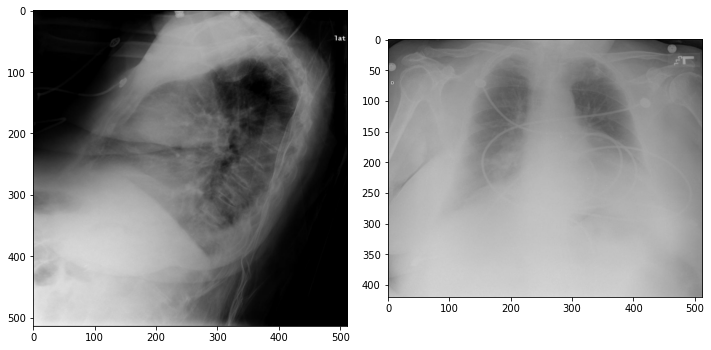

Acutal : <start> ap and lateral views were obtained bibasilar atelectasis and small left sided pleural effusion stable cardiomegaly no pneumothorax mild pulmonary vascular congestion <end>
Predicted: <start> no lung mediastinal are and there focal of identified granulomatous are and there focal of identified granulomatous are and there focal of identified granulomatous are
BLEU Score :- 0.5740224633402125


In [ ]:
test_img_cap(test.values[105])

In [ ]:
test['lateral X-Ray'][105]

'CXR3688_IM-1839-0001-0001.png'

In [ ]:
test['front X-Ray'][105]

'CXR3688_IM-1839-0001-0002.png'

In [ ]:
#https://machinelearningmastery.com/calculate-bleu-score-for-text-python/
b1 = 0
b2 = 0
b3 = 0
b4 = 0

image_1 = test['front X-Ray'][105]
image_2 = test['lateral X-Ray'][105]
result = evaluate(image_1,image_2)
reference = [test.findings[105]]

b1 =  b1 + bleu.sentence_bleu(reference, result ,weights=(1, 0, 0, 0))
b2 =  b2 + bleu.sentence_bleu(reference, result ,weights=(0.5, 0.5, 0, 0))
b3 =  b3 + bleu.sentence_bleu(reference, result ,weights=(0.33, 0.33, 0.33, 0))
b4 =  b4 + bleu.sentence_bleu(reference, result ,weights=(0.25, 0.25, 0.25, 0.25))

print("Bleu1 score is : ",b1)#/test.shape[0])
print("Bleu2 score is : ",b2)#/test.shape[0])
print("Bleu3 score is : ",b3)#/test.shape[0])
print("Bleu4 score is : ",b4)#/test.shape[0])

Bleu1 score is :  0.8210177662445399
Bleu2 score is :  0.5722258358996155
Bleu3 score is :  0.35272351066528324
Bleu4 score is :  0.2270946266591119


In [ ]:
test.findings[105]

'<start> ap and lateral views were obtained bibasilar atelectasis and small left sided pleural effusion stable cardiomegaly no pneumothorax mild pulmonary vascular congestion <end>'

In [ ]:
result

'<start> no lung mediastinal are and there focal of identified granulomatous are and there focal of identified granulomatous are and there focal of identified granulomatous are'

In [ ]:
reference

['<start> ap and lateral views were obtained bibasilar atelectasis and small left sided pleural effusion stable cardiomegaly no pneumothorax mild pulmonary vascular congestion <end>']

In [ ]:
#https://machinelearningmastery.com/calculate-bleu-score-for-text-python/
b1 = 0
b2 = 0
b3 = 0
b4 = 0

image_1 = test['front X-Ray'][87]
image_2 = test['lateral X-Ray'][87]
result = evaluate(image_1,image_2)
reference = [test.findings[87]]

b1 =  b1 + bleu.sentence_bleu(reference, result ,weights=(1, 0, 0, 0))
b2 =  b2 + bleu.sentence_bleu(reference, result ,weights=(0.5, 0.5, 0, 0))
b3 =  b3 + bleu.sentence_bleu(reference, result ,weights=(0.33, 0.33, 0.33, 0))
b4 =  b4 + bleu.sentence_bleu(reference, result ,weights=(0.25, 0.25, 0.25, 0.25))

print("Bleu1 score is : ",b1)#/test.shape[0])
print("Bleu2 score is : ",b2)#/test.shape[0])
print("Bleu3 score is : ",b3)#/test.shape[0])
print("Bleu4 score is : ",b4)#/test.shape[0])

Bleu1 score is :  0.5703088527462038
Bleu2 score is :  0.41034043403066756
Bleu3 score is :  0.2989343869527606
Bleu4 score is :  0.2191145187488665


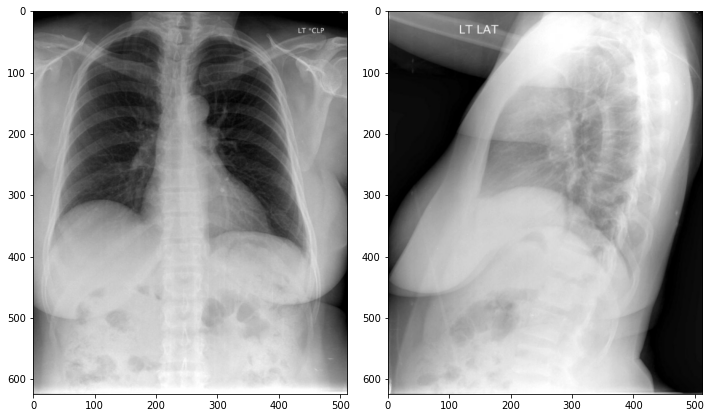

Acutal : <start> the cardiomediastinal silhouette is within normal limits for size and contour the lungs are normally inflated without evidence of focal airspace disease pleural effusion or pneumothorax no acute osseus abnormality <end>
Predicted: <start> no there focal of identified evidence no there focal of identified evidence no there focal of identified evidence no there focal of identified evidence no
BLEU Score :- 0.5691588283913814


In [ ]:
test_img_cap(test.values[87])

In [ ]:
test['lateral X-Ray'][87]

'CXR735_IM-2294-2001.png'

In [ ]:
test['front X-Ray'][87]

'CXR735_IM-2294-3001.png'

In [ ]:
test.findings[87]

'<start> the cardiomediastinal silhouette is within normal limits for size and contour the lungs are normally inflated without evidence of focal airspace disease pleural effusion or pneumothorax no acute osseus abnormality <end>'

In [ ]:
result

'<start> no there focal of identified evidence no there focal of identified evidence no there focal of identified evidence no there focal of identified evidence no'

In [ ]:
reference

['<start> the cardiomediastinal silhouette is within normal limits for size and contour the lungs are normally inflated without evidence of focal airspace disease pleural effusion or pneumothorax no acute osseus abnormality <end>']

In [ ]:
#https://machinelearningmastery.com/calculate-bleu-score-for-text-python/
b1 = 0
b2 = 0
b3 = 0
b4 = 0

image_1 = test['front X-Ray'][200]
image_2 = test['lateral X-Ray'][200]
result = evaluate(image_1,image_2)
reference = [test.findings[200]]

b1 =  b1 + bleu.sentence_bleu(reference, result ,weights=(1, 0, 0, 0))
b2 =  b2 + bleu.sentence_bleu(reference, result ,weights=(0.5, 0.5, 0, 0))
b3 =  b3 + bleu.sentence_bleu(reference, result ,weights=(0.33, 0.33, 0.33, 0))
b4 =  b4 + bleu.sentence_bleu(reference, result ,weights=(0.25, 0.25, 0.25, 0.25))

print("Bleu1 score is : ",b1)#/test.shape[0])
print("Bleu2 score is : ",b2)#/test.shape[0])
print("Bleu3 score is : ",b3)#/test.shape[0])
print("Bleu4 score is : ",b4)#/test.shape[0])

Bleu1 score is :  0.5166457615379457
Bleu2 score is :  0.4110731836917216
Bleu3 score is :  0.3217968929115855
Bleu4 score is :  0.26003327445666524


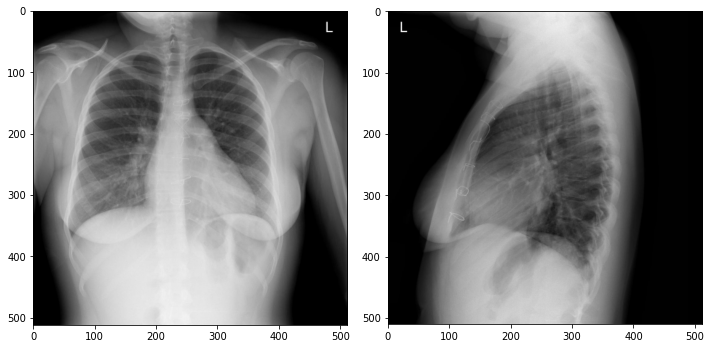

Acutal : <start> there is stable mild cardiomegaly with normal caliber pulmonary vasculature there are grossly intact sternotomy and mediastinal surgical clips there is no focal airspace disease pneumothorax or pleural effusion there are no acute bony findings <end>
Predicted: <start> no lung mediastinal are and there focal of identified evidence no lung mediastinal are and there focal of identified evidence no lung mediastinal are and
BLEU Score :- 0.5936781016890557


In [ ]:
test_img_cap(test.values[200])

In [ ]:
test['lateral X-Ray'][200]

'CXR327_IM-1552-2001.png'

In [ ]:
test['front X-Ray'][200]

'CXR327_IM-1552-1001.png'

In [ ]:
test.findings[200]

'<start> there is stable mild cardiomegaly with normal caliber pulmonary vasculature there are grossly intact sternotomy and mediastinal surgical clips there is no focal airspace disease pneumothorax or pleural effusion there are no acute bony findings <end>'

In [ ]:
result

'<start> no lung mediastinal are and there focal of identified evidence no lung mediastinal are and there focal of identified evidence no lung mediastinal are and'

In [ ]:
reference

['<start> there is stable mild cardiomegaly with normal caliber pulmonary vasculature there are grossly intact sternotomy and mediastinal surgical clips there is no focal airspace disease pneumothorax or pleural effusion there are no acute bony findings <end>']

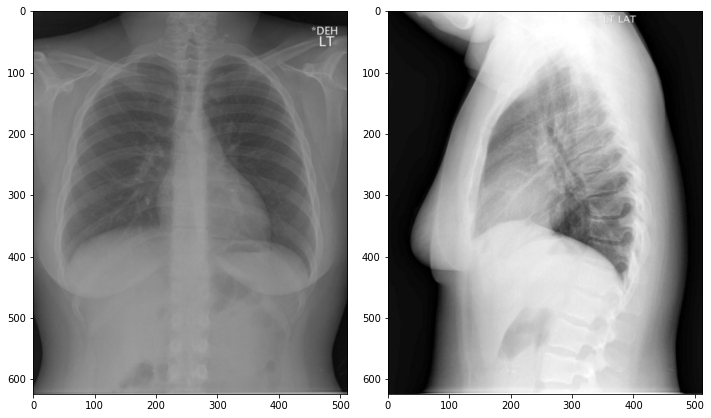

Acutal : <start> no focal consolidation no visualized pneumothorax no large pleural effusions heart size is normal the cardiomediastinal silhouette is grossly unremarkable <end>
Predicted: <start> no lung mediastinal are and there focal of identified evidence no lung mediastinal are and there focal of identified evidence no lung mediastinal are and
BLEU Score :- 0.5936781016890557


In [ ]:
test_img_cap(test.values[19])

In [ ]:
#https://machinelearningmastery.com/calculate-bleu-score-for-text-python/
b1 = 0
b2 = 0
b3 = 0
b4 = 0

image_1 = test['front X-Ray'][19]
image_2 = test['lateral X-Ray'][19]
result = evaluate(image_1,image_2)
reference = [test.findings[19]]

b1 =  b1 + bleu.sentence_bleu(reference, result ,weights=(1, 0, 0, 0))
b2 =  b2 + bleu.sentence_bleu(reference, result ,weights=(0.5, 0.5, 0, 0))
b3 =  b3 + bleu.sentence_bleu(reference, result ,weights=(0.33, 0.33, 0.33, 0))
b4 =  b4 + bleu.sentence_bleu(reference, result ,weights=(0.25, 0.25, 0.25, 0.25))

print("Bleu1 score is : ",b1)#/test.shape[0])
print("Bleu2 score is : ",b2)#/test.shape[0])
print("Bleu3 score is : ",b3)#/test.shape[0])
print("Bleu4 score is : ",b4)#/test.shape[0])

Bleu1 score is :  0.7730989928502454
Bleu2 score is :  0.5525713272997709
Bleu3 score is :  0.4003900666433379
Bleu4 score is :  0.3119565919415595


In [ ]:
test['lateral X-Ray'][19]

'CXR1428_IM-0274-2001.png'

In [ ]:
test['front X-Ray'][19]

'CXR1428_IM-0274-1001.png'

In [ ]:
test.findings[19]

'<start> no focal consolidation no visualized pneumothorax no large pleural effusions heart size is normal the cardiomediastinal silhouette is grossly unremarkable <end>'

In [ ]:
result

'<start> no lung mediastinal are and there focal of identified evidence no lung mediastinal are and there focal of identified evidence no lung mediastinal are and'

In [ ]:
reference

['<start> no focal consolidation no visualized pneumothorax no large pleural effusions heart size is normal the cardiomediastinal silhouette is grossly unremarkable <end>']

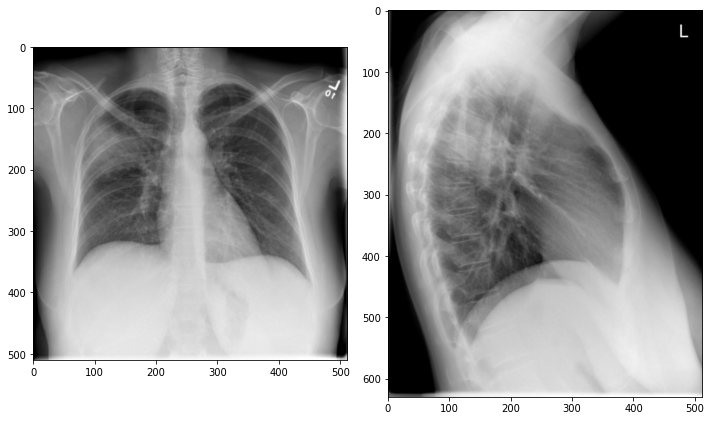

Acutal : <start> the cardiomediastinal silhouette and vasculature are within normal limits for size and contour there is right upper lobe airspace disease there is a rounded nodular opacity in the left upper lung measuring approximately mm which may represent further sequela of infectious process versus other pathology osseous structures are within normal limits for patient age <end>
Predicted: <start> no there focal of identified evidence no there focal of identified evidence no there focal of identified evidence no there focal of identified evidence no
BLEU Score :- 0.5691588283913814


In [ ]:
test_img_cap(test.values[1])

In [ ]:
#https://machinelearningmastery.com/calculate-bleu-score-for-text-python/
b1 = 0
b2 = 0
b3 = 0
b4 = 0

image_1 = test['front X-Ray'][1]
image_2 = test['lateral X-Ray'][1]
result = evaluate(image_1,image_2)
reference = [test.findings[1]]

b1 =  b1 + bleu.sentence_bleu(reference, result ,weights=(1, 0, 0, 0))
b2 =  b2 + bleu.sentence_bleu(reference, result ,weights=(0.5, 0.5, 0, 0))
b3 =  b3 + bleu.sentence_bleu(reference, result ,weights=(0.33, 0.33, 0.33, 0))
b4 =  b4 + bleu.sentence_bleu(reference, result ,weights=(0.25, 0.25, 0.25, 0.25))

print("Bleu1 score is : ",b1)#/test.shape[0])
print("Bleu2 score is : ",b2)#/test.shape[0])
print("Bleu3 score is : ",b3)#/test.shape[0])
print("Bleu4 score is : ",b4)#/test.shape[0])

Bleu1 score is :  0.24721991551946193
Bleu2 score is :  0.1827454090955459
Bleu3 score is :  0.13017923556978317
Bleu4 score is :  0.09095137591264267


In [ ]:
test['lateral X-Ray'][1]

'CXR564_IM-2165-2001.png'

In [ ]:
test['front X-Ray'][1]

'CXR564_IM-2165-1001.png'

In [ ]:
test.findings[1]

'<start> the cardiomediastinal silhouette and vasculature are within normal limits for size and contour there is right upper lobe airspace disease there is a rounded nodular opacity in the left upper lung measuring approximately mm which may represent further sequela of infectious process versus other pathology osseous structures are within normal limits for patient age <end>'

In [ ]:
result

'<start> no there focal of identified evidence no there focal of identified evidence no there focal of identified evidence no there focal of identified evidence no'

In [ ]:
reference

['<start> the cardiomediastinal silhouette and vasculature are within normal limits for size and contour there is right upper lobe airspace disease there is a rounded nodular opacity in the left upper lung measuring approximately mm which may represent further sequela of infectious process versus other pathology osseous structures are within normal limits for patient age <end>']

**Evaluation Metric : BLEU Score**
    
**Cumulative - scores**

In [ ]:
#https://machinelearningmastery.com/calculate-bleu-score-for-text-python/
b1 = 0
b2 = 0
b3 = 0
b4 = 0


for i in range(test.shape[0]):
  image_1 = test['front X-Ray'][i]
  image_2 = test['lateral X-Ray'][i]
  result = evaluate(image_1,image_2)
  reference = [test.findings[i]]
  

  
  b1 =  b1 + bleu.sentence_bleu(reference, result ,weights=(1, 0, 0, 0))
  b2 =  b2 + bleu.sentence_bleu(reference, result ,weights=(0.5, 0.5, 0, 0))
  b3 =  b3 + bleu.sentence_bleu(reference, result ,weights=(0.33, 0.33, 0.33, 0))
  b4 =  b4 + bleu.sentence_bleu(reference, result ,weights=(0.25, 0.25, 0.25, 0.25))



print("Bleu1 score is : ",b1/test.shape[0])
print("Bleu2 score is : ",b2/test.shape[0])
print("Bleu3 score is : ",b3/test.shape[0])
print("Bleu4 score is : ",b4/test.shape[0])

Bleu1 score is :  0.5410256971026653
Bleu2 score is :  0.39271717312606197
Bleu3 score is :  0.28102489417984156
Bleu4 score is :  0.20775382427335654


In [ ]:
from tabulate import tabulate
import pandas as pd

blue_table = pd.DataFrame({'Model[Cumulative_scores]' : ['BLEU-1', 'BLEU-2' , 'BLEU-3', 'BLEU-4'],
                   'Encoder-Decoder' : ['0.541', '0.392', '0.281', '0.208']})

print(tabulate(blue_table, headers='keys', tablefmt='psql'))

+----+----------------------------+-------------------+
|    | Model[Cumulative_scores]   |   Encoder-Decoder |
|----+----------------------------+-------------------|
|  0 | BLEU-1                     |             0.541 |
|  1 | BLEU-2                     |             0.392 |
|  2 | BLEU-3                     |             0.281 |
|  3 | BLEU-4                     |             0.208 |
+----+----------------------------+-------------------+


**Individual - scores**

In [ ]:
#https://machinelearningmastery.com/calculate-bleu-score-for-text-python/
b1 = 0
b2 = 0
b3 = 0
b4 = 0


for i in range(test.shape[0]):
  image_1 = test['front X-Ray'][i]
  image_2 = test['lateral X-Ray'][i]
  result = evaluate(image_1,image_2)
  reference = [test.findings[i]]
  

  
  b1 =  b1 + bleu.sentence_bleu(reference, result ,weights=(1, 0, 0, 0))
  b2 =  b2 + bleu.sentence_bleu(reference, result ,weights=(0, 1, 0, 0))
  b3 =  b3 + bleu.sentence_bleu(reference, result ,weights=(0, 0, 1, 0))
  b4 =  b4 + bleu.sentence_bleu(reference, result ,weights=(0, 0, 0, 1))



print("Bleu1 score is : ",b1/test.shape[0])
print("Bleu2 score is : ",b2/test.shape[0])
print("Bleu3 score is : ",b3/test.shape[0])
print("Bleu4 score is : ",b4/test.shape[0])

Bleu1 score is :  0.5410256971026653
Bleu2 score is :  0.2867911370067877
Bleu3 score is :  0.14237043339931393
Bleu4 score is :  0.08856867062457573


In [ ]:
from tabulate import tabulate
import pandas as pd

blue_table = pd.DataFrame({'Model[Individual_scores]' : ['BLEU-1', 'BLEU-2' , 'BLEU-3', 'BLEU-4'],
                   'Encoder-Decoder' : ['0.541', '0.287', '0.142', '0.089']})

print(tabulate(blue_table, headers='keys', tablefmt='psql'))

+----+----------------------------+-------------------+
|    | Model[Individual_scores]   |   Encoder-Decoder |
|----+----------------------------+-------------------|
|  0 | BLEU-1                     |             0.541 |
|  1 | BLEU-2                     |             0.287 |
|  2 | BLEU-3                     |             0.142 |
|  3 | BLEU-4                     |             0.089 |
+----+----------------------------+-------------------+


**Total Observations :**


For constructing baseline model :
- First I worked on getting structured data.

- limiting the data point to 2 images per data point, if we have 5 images, its 4+1 (all image + last image) so make it as 4 data points, I converted multiple images into two images using their projection. The projection dataset has been taken from kaggle.

- Dataset link : https://www.kaggle.com/raddar/chest-xrays-indiana-university

- I have used simple Encoder-Decoder architacture for basic modelling.

- Then extract the features from Images and did text tokenization and pass these tensors to model for training.

- This is basic model, we used LSTM model with pretrained-CheXNet model and I have tuned the model accordingly.

- I started with 0.001 as learning rate and gradually decrease it by ReduceLROnPlateau callback.

- CheXNet competition link : https://stanfordmlgroup.github.io/projects/chexnet/

- Publically Available weight : https://www.kaggle.com/theewok/chexnet-keras-weights

- Then I add dropout to learn more robust features in both encoder and decoder layers.

- I have also experimented with various batch sizes and observes lower batch size helps to achieve better test accuracy.

- Instead of dense layer I used TimeDistributedDense layer. as it applies a same dense to every time step during GRU/LSTM Cell unrolling. So the error function will be between predicted label sequence and the actual label sequence. (Which is normally the requirement for sequence to sequence labeling problems).

- The bleu score has got 0.541 which is somewhat satisfactory compared to other referred models.

- I have also used Cumulative N-Gram Scores(BLEU Score). Cumulative scores refer to the calculation of individual n-gram scores at all orders from 1 to n and weighting them by calculating the weighted geometric mean.